In [64]:
from IPython.display import HTML, display
COMPACT_PRINT_CSS = "<style>\n@page { size: A4 portrait; margin: 11mm 12mm 12mm 12mm; }\n@media print {\n  :root { --jp-content-font-family: Arial, sans-serif; }\n  body { background: white !important; }\n  html, body { margin: 0 !important; padding: 0 !important; width: auto !important; }\n  body, .jp-RenderedHTMLCommon { font-family: Arial, sans-serif !important;\n    font-size: 9.6pt !important; line-height: 1.23 !important; color: #111 !important; }\n  .jp-Notebook { padding: 0 !important; margin: 0 !important; width: auto !important;\n    max-width: none !important; min-width: 0 !important; }\n  main, .jp-Cell, .jp-Cell-inputWrapper, .jp-Cell-outputWrapper,\n  .jp-InputArea, .jp-OutputArea, .jp-OutputArea-child, .jp-InputArea-editor,\n  .jp-RenderedHTMLCommon, .jp-RenderedText { min-width: 0 !important;\n    max-width: 100% !important; }\n  .jp-Cell { padding: 0 !important; margin: 0 0 4pt !important;\n    break-inside: auto !important; }\n  .jp-Cell-inputWrapper, .jp-Cell-outputWrapper { margin: 0 !important;\n    padding: 0 !important; }\n  .jp-InputPrompt, .jp-OutputPrompt, .jp-Collapser { display: none !important; }\n  .jp-RenderedMarkdown { padding: 0 !important; }\n  .jp-RenderedMarkdown h1 { font-size: 15pt !important; line-height: 1.14 !important;\n    margin: 0 0 6pt !important; break-after: avoid !important; }\n  .jp-RenderedMarkdown h2 { font-size: 12pt !important; line-height: 1.18 !important;\n    margin: 8pt 0 4pt !important; break-after: avoid !important; }\n  .jp-RenderedMarkdown p { margin: 3pt 0 5pt !important; orphans: 3; widows: 3; }\n  .jp-RenderedMarkdown a { color: #155d8b !important; text-decoration: none; }\n  .jp-InputArea-editor { border: 0.4pt solid #d7dce2 !important;\n    background: #f6f7f9 !important; border-radius: 0 !important; padding: 0 !important; }\n  .highlight { padding: 0 !important; margin: 0 !important; background: transparent !important; }\n  .highlight pre { font-family: 'DejaVu Sans Mono', Consolas, monospace !important;\n    font-size: 8.2pt !important; line-height: 1.17 !important; padding: 5pt 6pt !important;\n    margin: 0 !important; white-space: pre-wrap !important; overflow-wrap: anywhere !important;\n    word-break: normal !important; tab-size: 4; }\n  pre, code, .cm-editor, .jp-InputArea-editor { overflow: visible !important;\n    text-overflow: clip !important; max-height: none !important; }\n  .jp-RenderedText pre { font-family: 'DejaVu Sans Mono', Consolas, monospace !important;\n    font-size: 8.1pt !important; line-height: 1.2 !important; padding: 2pt 0 !important;\n    margin: 0 !important; white-space: pre-wrap !important; overflow-wrap: anywhere !important; }\n  .jp-RenderedImage { padding: 2pt 0 !important; text-align: center !important;\n    break-inside: avoid !important; }\n  .jp-RenderedImage img { display: block !important; width: 100% !important;\n    max-width: 100% !important; height: auto !important; margin: 0 auto !important;\n    break-inside: avoid !important; }\n  .jp-OutputArea-child { padding: 0 !important; break-inside: avoid !important; }\n  .jp-CodeCell[id$='-hidden'] > .jp-Cell-inputWrapper { display: none !important; }\n  .jp-CodeCell[id$='-hidden']:not(:has(.jp-Cell-outputWrapper)) { display: none !important; }\n  [id='cell-id=report-print-style'] { display: none !important; }\n  .anchor-link { display: none !important; }\n  mjx-container { font-size: 100% !important; }\n}\n</style>"
display(HTML(COMPACT_PRINT_CSS))



## 000

**EN3160Assignment1onIntensityTransformationsandNeighborhood Filtering**

**A.H.T.M.Weerakoon**

**230689A**

**September 14**

**Question 01**

In [65]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

In [66]:
def intensity_transform(im, breakpoints):
    breakpoints = sorted(breakpoints, key=lambda p: p[0])    
    r_vals = [p[0] for p in breakpoints]
    s_vals = [p[1] for p in breakpoints]
    transformed = np.interp(im, r_vals, s_vals)    
    return np.uint8(transformed)

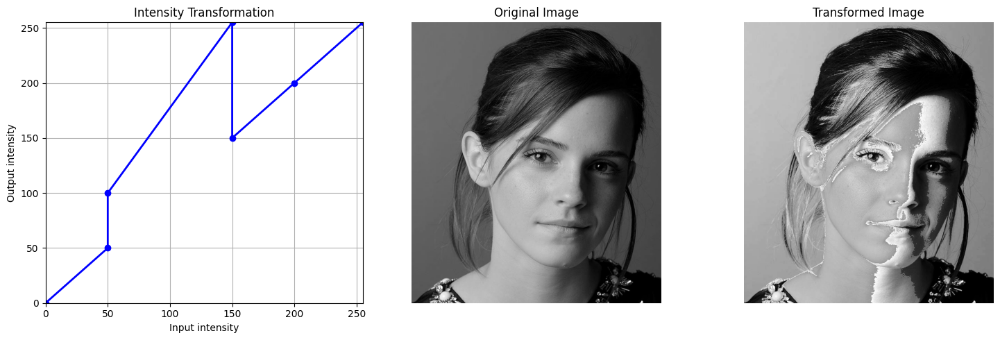

In [67]:
img = cv.imread('emma.jpg', cv.IMREAD_GRAYSCALE)
breakpoints = [(0, 0),(50, 50),(50,100),(150, 255),(150,150),(200,200),
               (255, 255)]
transformed_img = intensity_transform(img, breakpoints)

fig = plt.figure(figsize=(15, 5))
ax1 = fig.add_subplot(1, 3, 1)
r_vals = [p[0] for p in breakpoints]
s_vals = [p[1] for p in breakpoints]
ax1.plot(r_vals, s_vals, 'b-o', linewidth=2)
ax1.set_title('Intensity Transformation')
ax1.set_xlabel('Input intensity')
ax1.set_ylabel('Output intensity')
ax1.set_xlim([0, 255])
ax1.set_ylim([0, 255])
ax1.grid(True)

ax2 = fig.add_subplot(1, 3, 2)
ax2.imshow(img, cmap='gray', vmin=0, vmax=255)
ax2.set_title('Original Image')
ax2.axis('off')

ax3 = fig.add_subplot(1, 3, 3)
ax3.imshow(transformed_img, cmap='gray', vmin=0, vmax=255)
ax3.set_title('Transformed Image')
ax3.axis('off')

plt.tight_layout()
plt.show()

**Chosen Breakpoints**
The selected intensity breakpoints are:
* $(0, 0)$, $(0, 50)$, $(200, 255)$, $(255, 255)$

**Analysis of Transformation Effect**
* **Mid-Tone Contrast:** Intensities from $[0, 200]$ are stretched toward $[50, 255]$, enhancing detail and texture.
* **Dark Region Enhancement:** The mapping $(0, 0) \rightarrow (0, 50)$ lifts subtle shadow details.
* **Highlight Preservation:** The segment $(200, 255) \rightarrow (255, 255)$ compresses bright intensities, reducing clipping.
Overall, the piecewise-linear transformation improves **contrast, shadow visibility, and overall image detail** while preserving highlights.

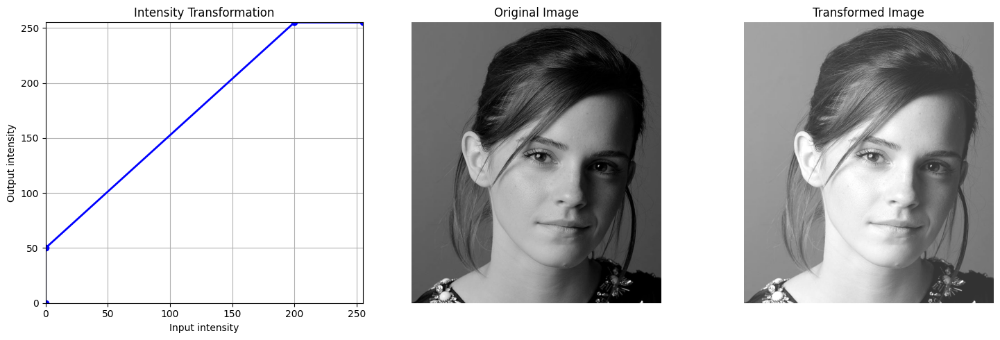

In [68]:
img = cv.imread('emma.jpg', cv.IMREAD_GRAYSCALE)
breakpoints = [(0,0),(0, 50),(200,255),(255, 255)]
transformed_img = intensity_transform(img, breakpoints)

fig = plt.figure(figsize=(15, 5))
ax1 = fig.add_subplot(1, 3, 1)
r_vals = [p[0] for p in breakpoints]
s_vals = [p[1] for p in breakpoints]
ax1.plot(r_vals, s_vals, 'b-o', linewidth=2)
ax1.set_title('Intensity Transformation')
ax1.set_xlabel('Input intensity')
ax1.set_ylabel('Output intensity')
ax1.set_xlim([0, 255])
ax1.set_ylim([0, 255])
ax1.grid(True)

ax2 = fig.add_subplot(1, 3, 2)
ax2.imshow(img, cmap='gray', vmin=0, vmax=255)
ax2.set_title('Original Image')
ax2.axis('off')

ax3 = fig.add_subplot(1, 3, 3)
ax3.imshow(transformed_img, cmap='gray', vmin=0, vmax=255)
ax3.set_title('Transformed Image')
ax3.axis('off')
plt.tight_layout()
plt.show()

**Question 02**

In [69]:
def gaussian_intensity_transform(im, mu, sigma):
    x = im.astype(np.float32)
    transformed = 255.0 * np.exp(-((x - mu) ** 2) / (2 * (sigma ** 2)))
    return np.clip(np.round(transformed), 0, 255).astype(np.uint8)

**Gaussian Pulse Transformation for White and Gray Matter**

A continuous Gaussian transformation was applied to the brain **Proton Density (PD) MRI** to selectively enhance White Matter and Gray Matter:

$$
f(x) = 255 \cdot \exp\left(-\frac{(x-\mu)^2}{2\sigma^2}\right)
$$

**White Matter**
- **\(\mu = 200,\ \sigma = 20\)**, Enhances bright intensities (**~180–255**) corresponding to White Matter while suppressing darker regions.
- 
**Gray Matter**
- **\(\mu = 150,\ \sigma = 20\)**, Enhances mid-range intensities (**~100–160**) corresponding to Gray Matter while suppressing both dark background and bright White Matter.
  
Overall, the Gaussian transformation acts as a **selective intensity filter**, emphasizing the desired tissue while suppressing other intensity ranges.

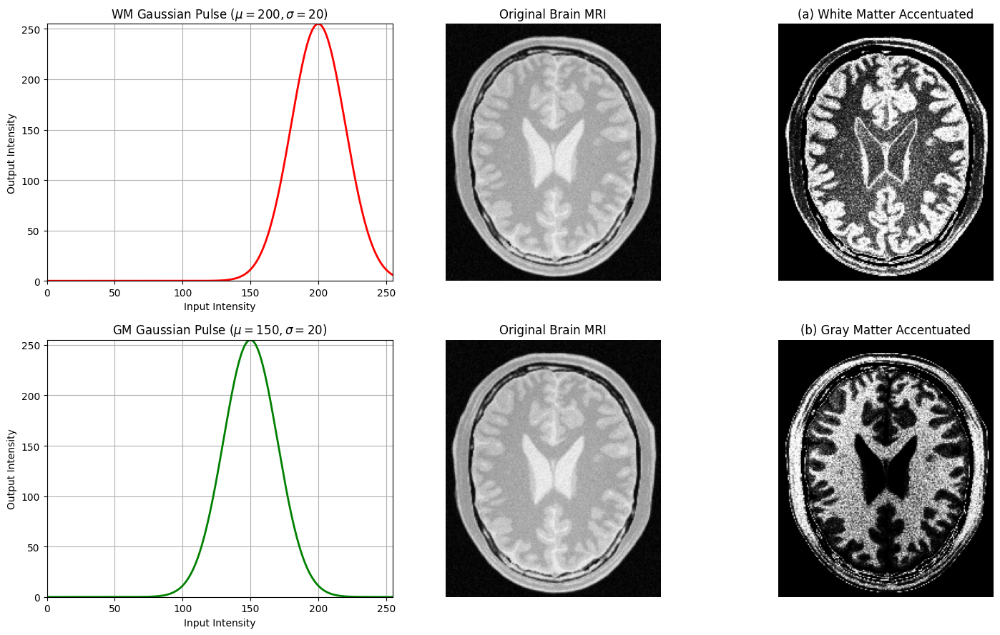

In [70]:
img_path = 'brain.jpeg'  
img_brain = cv.imread(img_path, cv.IMREAD_GRAYSCALE)
mu_wm, sigma_wm = 200, 20
mu_gm, sigma_gm = 150, 20

img_wm = gaussian_intensity_transform(img_brain, mu_wm, sigma_wm)
img_gm = gaussian_intensity_transform(img_brain, mu_gm, sigma_gm)

x_range = np.arange(0, 256)
curve_wm = 255.0 * np.exp(-((x_range - mu_wm) ** 2) / (2 * (sigma_wm ** 2)))
curve_gm = 255.0 * np.exp(-((x_range - mu_gm) ** 2) / (2 * (sigma_gm ** 2)))

fig, axes = plt.subplots(2, 3, figsize=(15, 9))
axes[0, 0].plot(x_range, curve_wm, 'r-', linewidth=2)
axes[0, 0].set_title(f'WM Gaussian Pulse ($\mu={mu_wm}, \sigma={sigma_wm}$)')
axes[0, 0].set_xlabel('Input Intensity')
axes[0, 0].set_ylabel('Output Intensity')
axes[0, 0].set_xlim([0, 255])
axes[0, 0].set_ylim([0, 255])
axes[0, 0].grid(True)
axes[0, 1].imshow(img_brain, cmap='gray', vmin=0, vmax=255)
axes[0, 1].set_title('Original Brain MRI')
axes[0, 1].axis('off')
axes[0, 2].imshow(img_wm, cmap='gray', vmin=0, vmax=255)
axes[0, 2].set_title('(a) White Matter Accentuated')
axes[0, 2].axis('off')

axes[1, 0].plot(x_range, curve_gm, 'g-', linewidth=2)
axes[1, 0].set_title(f'GM Gaussian Pulse ($\mu={mu_gm}, \sigma={sigma_gm}$)')
axes[1, 0].set_xlabel('Input Intensity')
axes[1, 0].set_ylabel('Output Intensity')
axes[1, 0].set_xlim([0, 255])
axes[1, 0].set_ylim([0, 255])
axes[1, 0].grid(True)
axes[1, 1].imshow(img_brain, cmap='gray', vmin=0, vmax=255)
axes[1, 1].set_title('Original Brain MRI')
axes[1, 1].axis('off')
axes[1, 2].imshow(img_gm, cmap='gray', vmin=0, vmax=255)
axes[1, 2].set_title('(b) Gray Matter Accentuated')
axes[1, 2].axis('off')
plt.tight_layout()
plt.show()

**Question 03**

**Gamma Correction in the L\*a\*b\* Color Space**

Gamma correction was applied only to the **L (Lightness)** channel of the **L\*a\*b\*** color space, preserving the chromaticity components **a** and **b**.
The transformation is:

$$
L_{\text{out}} = 255 \cdot \left(\frac{L_{\text{in}}}{255}\right)^\gamma
$$

**Gamma Selection**
- **\(\gamma = 0.5\)**, Since **\(\gamma < 1\)**, darker and mid-tone pixels are mapped to higher intensities, improving visibility of shadowed details.
- 
**Histogram Analysis**
The corrected **L-channel histogram shifts toward higher intensities**, indicating enhanced brightness and contrast in darker regions while preserving the original color information.

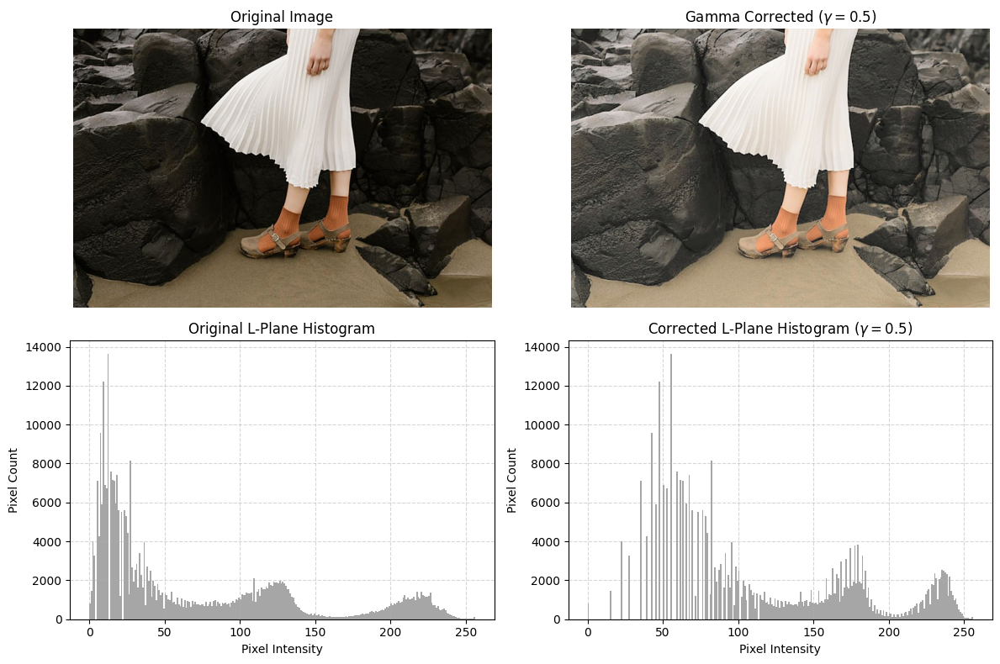

Selected gamma value: 0.5


In [71]:
img_path = 'gamma.jpeg'  
img_bgr = cv.imread(img_path)
lab_img = cv.cvtColor(img_bgr, cv.COLOR_BGR2LAB)
L, a, b = cv.split(lab_img)
gamma = 0.5 
L_normalized = L / 255.0
L_corrected = np.clip(255.0 * (L_normalized ** gamma), 0, 255).astype(np.uint8)

lab_corrected = cv.merge([L_corrected, a, b])
result_bgr = cv.cvtColor(lab_corrected, cv.COLOR_LAB2BGR)
img_rgb = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)
result_rgb = cv.cvtColor(result_bgr, cv.COLOR_BGR2RGB)

fig, axes = plt.subplots(2, 2, figsize=(12, 8))
axes[0, 0].imshow(img_rgb)
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

axes[0, 1].imshow(result_rgb)
axes[0, 1].set_title(f'Gamma Corrected ($\gamma = {gamma}$)')
axes[0, 1].axis('off')

axes[1, 0].hist(L.ravel(), bins=256, range=[0, 256], color='gray', alpha=0.7)
axes[1, 0].set_title('Original L-Plane Histogram')
axes[1, 0].set_xlabel('Pixel Intensity')
axes[1, 0].set_ylabel('Pixel Count')
axes[1, 0].grid(True, linestyle='--', alpha=0.5)

axes[1, 1].hist(L_corrected.ravel(), bins=256, range=[0, 256], color='gray', 
                alpha=0.7)
axes[1, 1].set_title(f'Corrected L-Plane Histogram ($\gamma = {gamma}$)')
axes[1, 1].set_xlabel('Pixel Intensity')
axes[1, 1].set_ylabel('Pixel Count')
axes[1, 1].grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()
print(f"Selected gamma value: {gamma}")

**Question 04**

In [72]:
def enhance_vibrance(s_channel, a, sigma=70.0):
    x = s_channel.astype(np.float32)
    vibrance_boost = a * 128.0 * np.exp(-((x - 128.0)**2) / (2.0 * (sigma**2)))
    transformed = x + vibrance_boost    
    return np.clip(np.round(transformed), 0, 255).astype(np.uint8)

**Vibrance Enhancement in the HSV Color Space**

Vibrance enhancement was applied to the **S (Saturation)** channel in the **HSV** color space to increase color intensity while avoiding excessive saturation.
The transformation is:

$$
f(x) = \min\left(
x + a \cdot 128 \exp\left(-\frac{(x-128)^2}{2\sigma^2}\right),
255
\right)
$$

**Selective Saturation Enhancement**
- **\(a = 0.6\)** — enhancement strength.
- **\(\sigma = 70\)** — Gaussian spread.
- The boost is centered at **\(x = 128\)**, mainly enhancing muted and mid-saturation colors while minimizing changes to very low or highly saturated regions.
- 
**HSV Decomposition and Recombination**
The image is decomposed into **H (Hue), S (Saturation), and V (Value)** channels. Only the **S channel** is modified, while H and V remain unchanged. The channels are then recombined and converted back to RGB, producing a more vibrant image while preserving natural colors and reducing over-saturation artifacts.

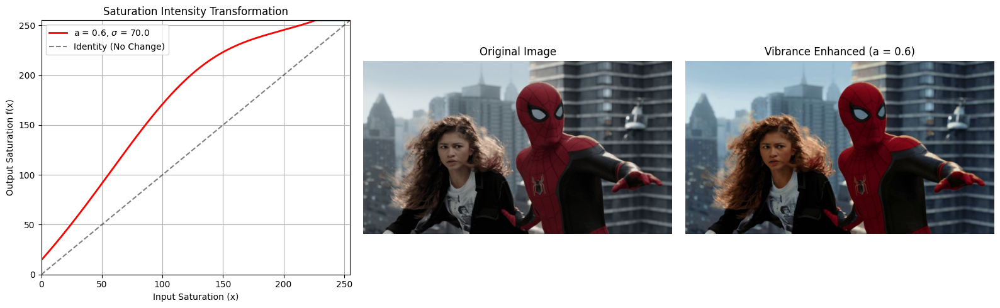

Reported value of parameter a: 0.6


In [82]:
img_path = 'spidy.jpeg' 
img_bgr = cv.imread(img_path)
hsv_img = cv.cvtColor(img_bgr, cv.COLOR_BGR2HSV)
H, S, V = cv.split(hsv_img)

a_val = 0.6  
sigma_val = 70.0
S_enhanced = enhance_vibrance(S, a=a_val, sigma=sigma_val)

hsv_enhanced = cv.merge([H, S_enhanced, V])
result_bgr = cv.cvtColor(hsv_enhanced, cv.COLOR_HSV2BGR)
img_rgb = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)
result_rgb = cv.cvtColor(result_bgr, cv.COLOR_BGR2RGB)

fig = plt.figure(figsize=(16, 5))
ax1 = fig.add_subplot(1, 3, 1)
x_vals = np.arange(0, 256, dtype=np.float32)
y_vals = np.minimum(x_vals + a_val * 128.0 * np.exp(-((x_vals - 128.0)**2) / 
                                            (2.0 * (sigma_val**2))), 255.0)
ax1.plot(x_vals, y_vals, 'r-', 
         linewidth=2, label=f'a = {a_val}, $\sigma$ = {sigma_val}')
ax1.plot([0, 255], [0, 255], 'k--', alpha=0.5, label='Identity (No Change)')
ax1.set_title('Saturation Intensity Transformation')
ax1.set_xlabel('Input Saturation (x)')
ax1.set_ylabel('Output Saturation f(x)')
ax1.set_xlim([0, 255])
ax1.set_ylim([0, 255])
ax1.legend()
ax1.grid(True)

ax2 = fig.add_subplot(1, 3, 2)
ax2.imshow(img_rgb)
ax2.set_title('Original Image')
ax2.axis('off')

ax3 = fig.add_subplot(1, 3, 3)
ax3.imshow(result_rgb)
ax3.set_title(f'Vibrance Enhanced (a = {a_val})')
ax3.axis('off')
plt.tight_layout()
plt.show()
print(f"Reported value of parameter a: {a_val}")

**Question 05**

**Histogram Equalization for Contrast Enhancement**

Histogram equalization improves image contrast by redistributing pixel intensities across the full **0–255** grayscale range.

**CDF Mapping**
The intensity transformation is based on the **Cumulative Distribution Function (CDF)**:

$$
T(r) = \text{round}\left(
\frac{\text{CDF}(r)-\text{CDF}_{\min}}
{(M \times N)-\text{CDF}_{\min}}
\times 255
\right)
$$

where \(r\) is the input intensity, \(\text{CDF}_{\min}\) is the first non-zero CDF value, and \(M \times N\) is the total number of pixels.

**Histogram Analysis**
The original histogram is concentrated within a narrow intensity range, indicating **low contrast**. After equalization, intensities are spread across **0–255**, improving the dynamic range, image details, and overall contrast.

In [83]:
def custom_histogram_equalization(im):
    hist = np.zeros(256, dtype=np.int32)
    for pixel in im.ravel():
        hist[pixel] += 1
    cdf = np.cumsum(hist)
    cdf_min = cdf[cdf > 0].min()
    total_pixels = im.shape[0] * im.shape[1]
    lut = np.round(((cdf - cdf_min) /
        (total_pixels - cdf_min)) * 255).astype(np.uint8)
    equalized_im = lut[im]
    eq_hist = np.zeros(256, dtype=np.int32)
    for pixel in equalized_im.ravel():
        eq_hist[pixel] += 1
    return equalized_im, hist, eq_hist

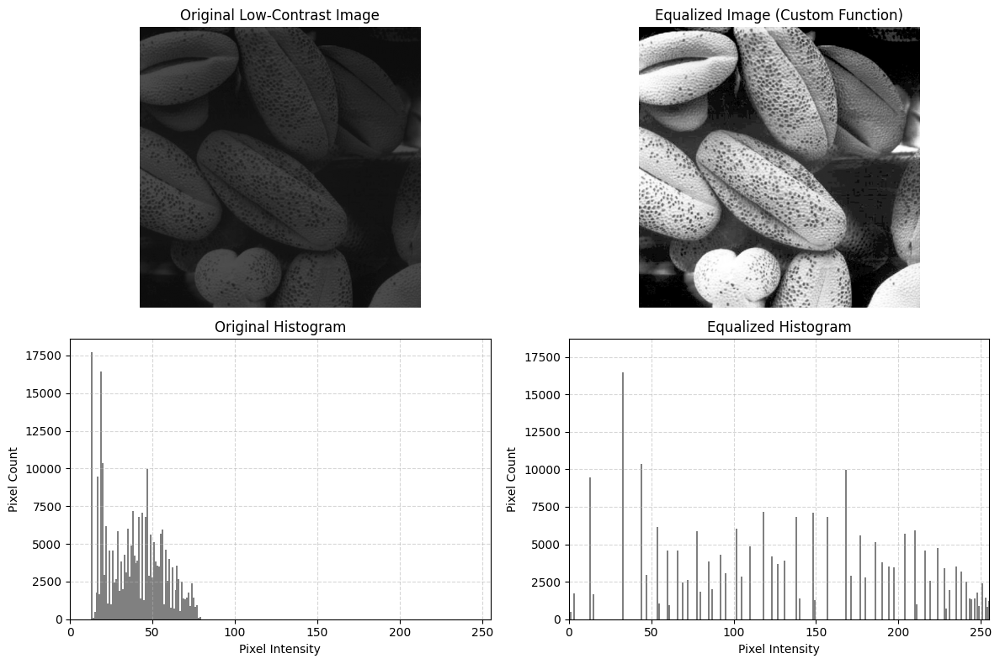

In [84]:
img_path = 'shells.tif'  
img_gray = cv.imread(img_path, cv.IMREAD_GRAYSCALE)

eq_img, orig_hist, eq_hist = custom_histogram_equalization(img_gray)

fig, axes = plt.subplots(2, 2, figsize=(12, 8))
axes[0, 0].imshow(img_gray, cmap='gray', vmin=0, vmax=255)
axes[0, 0].set_title('Original Low-Contrast Image')
axes[0, 0].axis('off')

axes[0, 1].imshow(eq_img, cmap='gray', vmin=0, vmax=255)
axes[0, 1].set_title('Equalized Image (Custom Function)')
axes[0, 1].axis('off')

axes[1, 0].bar(range(256), orig_hist, width=1, color='gray')
axes[1, 0].set_title('Original Histogram')
axes[1, 0].set_xlabel('Pixel Intensity')
axes[1, 0].set_ylabel('Pixel Count')
axes[1, 0].set_xlim([0, 255])
axes[1, 0].grid(True, linestyle='--', alpha=0.5)

axes[1, 1].bar(range(256), eq_hist, width=1, color='gray')
axes[1, 1].set_title('Equalized Histogram')
axes[1, 1].set_xlabel('Pixel Intensity')
axes[1, 1].set_ylabel('Pixel Count')
axes[1, 1].set_xlim([0, 255])
axes[1, 1].grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

**Question 06**

**Foreground-Only Histogram Equalization Using HSV Masking**

To avoid altering the flat background, histogram equalization is applied **only to the foreground** using an HSV-based binary mask.

**Plane Selection and Thresholding**
The image is decomposed into **H, S, and V** channels. The **Saturation (S)** channel provides strong foreground–background contrast and is used to generate the foreground mask through thresholding.

**Masked CDF Equalization**
The CDF is calculated only from foreground pixels, \(N_{\text{fg}}\), using:

$$
T(r) = \text{round}\left(
\frac{\text{CDF}(r)-\text{CDF}_{\min}}
{N_{\text{fg}}-\text{CDF}_{\min}}
\times 255
\right)
$$

This ensures that only foreground intensities are redistributed across the **0–255** range.

**Recombination**
The enhanced foreground is combined with the **original background** using the binary mask, preserving the background while improving foreground contrast and detail.

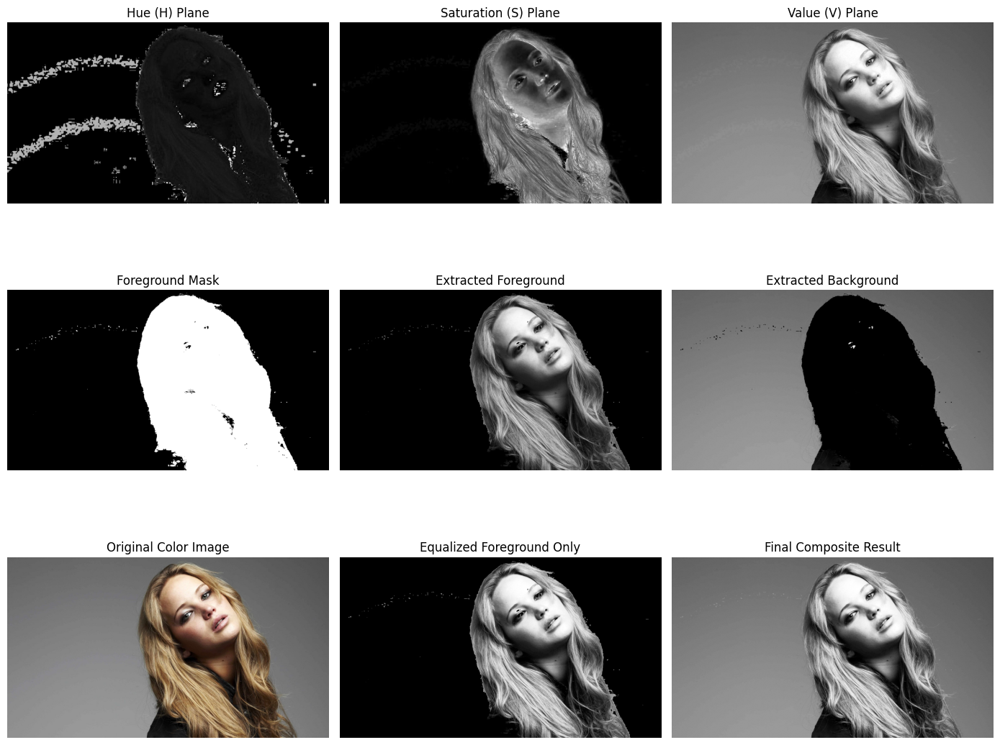

In [86]:
img_path = 'jeniffer.jpeg'
img_bgr = cv.imread(img_path)
img_rgb = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)
img_gray = cv.cvtColor(img_bgr, cv.COLOR_BGR2GRAY)

hsv_img = cv.cvtColor(img_bgr, cv.COLOR_BGR2HSV)
H, S, V = cv.split(hsv_img)
_, mask = cv.threshold(S, 12, 255, cv.THRESH_BINARY)
fg = cv.bitwise_and(img_gray, img_gray, mask=mask)
fg_pixels = fg[mask > 0]
hist, _ = np.histogram(fg_pixels, bins=256, range=[0, 256])
cdf = np.cumsum(hist)
cdf_min = cdf[cdf > 0].min()
total_fg_pixels = fg_pixels.size
lut = np.round(((cdf - cdf_min) / 
    (total_fg_pixels - cdf_min)) * 255).astype(np.uint8)
lut[0] = 0  
fg_equalized = lut[fg]
fg_equalized = cv.bitwise_and(fg_equalized, fg_equalized, mask=mask)
bg_mask = cv.bitwise_not(mask)
bg = cv.bitwise_and(img_gray, img_gray, mask=bg_mask)
result = cv.add(bg, fg_equalized)

fig, axes = plt.subplots(3, 3, figsize=(14, 12))
axes[0, 0].imshow(H, cmap='gray')
axes[0, 0].set_title('Hue (H) Plane')
axes[0, 0].axis('off')
axes[0, 1].imshow(S, cmap='gray')
axes[0, 1].set_title('Saturation (S) Plane')
axes[0, 1].axis('off')
axes[0, 2].imshow(V, cmap='gray')
axes[0, 2].set_title('Value (V) Plane')
axes[0, 2].axis('off')

axes[1, 0].imshow(mask, cmap='gray')
axes[1, 0].set_title('Foreground Mask')
axes[1, 0].axis('off')
axes[1, 1].imshow(fg, cmap='gray')
axes[1, 1].set_title('Extracted Foreground')
axes[1, 1].axis('off')
axes[1, 2].imshow(bg, cmap='gray')
axes[1, 2].set_title('Extracted Background')
axes[1, 2].axis('off')

axes[2, 0].imshow(img_rgb)
axes[2, 0].set_title('Original Color Image')
axes[2, 0].axis('off')
axes[2, 1].imshow(fg_equalized, cmap='gray')
axes[2, 1].set_title('Equalized Foreground Only')
axes[2, 1].axis('off')
axes[2, 2].imshow(result, cmap='gray')
axes[2, 2].set_title('Final Composite Result')
axes[2, 2].axis('off')
plt.tight_layout()
plt.show()

**Question 07**

In [87]:
def custom_filter2d(im, kernel):
    h, w = im.shape
    kh, kw = kernel.shape
    pad_h, pad_w = kh // 2, kw // 2
    padded = np.pad(im, ((pad_h, pad_h), (pad_w, pad_w)), mode='reflect')
    out = np.zeros_like(im, dtype=np.float64)
    for i in range(h):
        for j in range(w):
            out[i, j] = np.sum(padded[i:i+kh, j:j+kw] * kernel)
    return out

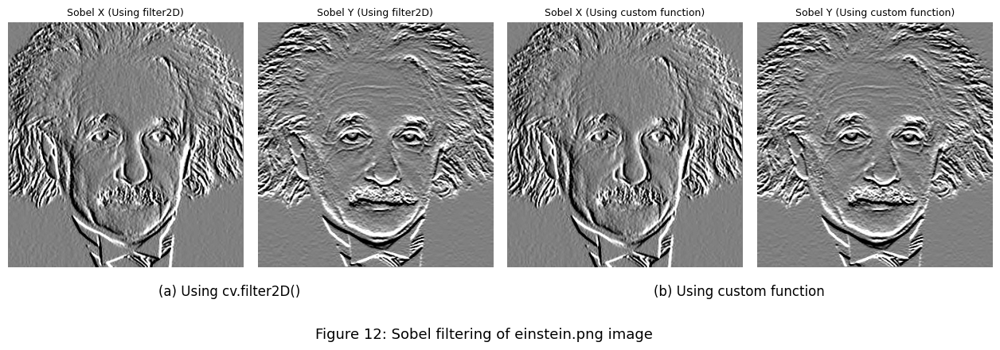

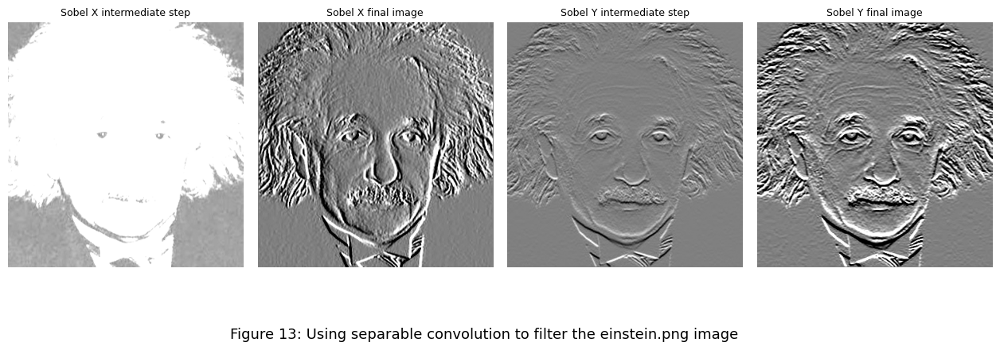

In [88]:
img_path = 'einstein.jpeg'
img = cv.imread(img_path, cv.IMREAD_GRAYSCALE)
img_float = img.astype(np.float64)

sobel_x = np.array([[1, 0, -1], [2, 0, -2], [1, 0, -1]], dtype=np.float64)
sobel_y = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]], dtype=np.float64)

v_smooth = np.array([[1], [2], [1]], dtype=np.float64)       # 3x1
h_diff   = np.array([[1, 0, -1]], dtype=np.float64)       # 1x3
v_diff   = np.array([[1], [0], [-1]], dtype=np.float64)      # 3x1
h_smooth = np.array([[1, 2, 1]], dtype=np.float64)          # 1x3

def to_gray_display(grad):
    return np.clip(grad + 128.0, 0, 255).astype(np.uint8)

gx_a = cv.filter2D(img_float, -1, sobel_x)
gy_a = cv.filter2D(img_float, -1, sobel_y)
gx_b = custom_filter2d(img_float, sobel_x)
gy_b = custom_filter2d(img_float, sobel_y)

gx_inter = cv.filter2D(img_float, -1, v_smooth)
gx_final = cv.filter2D(gx_inter, -1, h_diff)
gy_inter = cv.filter2D(img_float, -1, v_diff)
gy_final = cv.filter2D(gy_inter, -1, h_smooth)

fig12, axes12 = plt.subplots(1, 4, figsize=(16, 4))
axes12[0].imshow(to_gray_display(gx_a), cmap='gray', vmin=0, vmax=255)
axes12[0].set_title('Sobel X (Using filter2D)', fontsize=9)
axes12[0].axis('off')
axes12[1].imshow(to_gray_display(gy_a), cmap='gray', vmin=0, vmax=255)
axes12[1].set_title('Sobel Y (Using filter2D)', fontsize=9)
axes12[1].axis('off')
axes12[2].imshow(to_gray_display(gx_b), cmap='gray', vmin=0, vmax=255)
axes12[2].set_title('Sobel X (Using custom function)', fontsize=9)
axes12[2].axis('off')
axes12[3].imshow(to_gray_display(gy_b), cmap='gray', vmin=0, vmax=255)
axes12[3].set_title('Sobel Y (Using custom function)', fontsize=9)
axes12[3].axis('off')
plt.subplots_adjust(wspace=0.05, hspace=0)
fig12.text(0.30, 0.02, '(a) Using cv.filter2D()', ha='center', fontsize=12)
fig12.text(0.70, 0.02, '(b) Using custom function', ha='center', fontsize=12)
fig12.suptitle('Figure 12: Sobel filtering of einstein.png image',
               y=-0.08, fontsize=13)
plt.show()

fig13, axes13 = plt.subplots(1, 4, figsize=(16, 4))
axes13[0].imshow(to_gray_display(gx_inter), cmap='gray', vmin=0, vmax=255)
axes13[0].set_title('Sobel X intermediate step', fontsize=9)
axes13[0].axis('off')
axes13[1].imshow(to_gray_display(gx_final), cmap='gray', vmin=0, vmax=255)
axes13[1].set_title('Sobel X final image', fontsize=9)
axes13[1].axis('off')
axes13[2].imshow(to_gray_display(gy_inter), cmap='gray', vmin=0, vmax=255)
axes13[2].set_title('Sobel Y intermediate step', fontsize=9)
axes13[2].axis('off')
axes13[3].imshow(to_gray_display(gy_final), cmap='gray', vmin=0, vmax=255)
axes13[3].set_title('Sobel Y final image', fontsize=9)
axes13[3].axis('off')
plt.subplots_adjust(wspace=0.05, hspace=0)
fig13.suptitle(
    'Figure 13: Using separable convolution to filter the einstein.png image'
               , y=-0.08, fontsize=13)
plt.show()

**Question 08**

**Image Scaling Using Nearest Neighbor and Bilinear Interpolation**

The images were scaled by a factor of **4** using **Nearest Neighbor** and **Bilinear Interpolation**.

**Nearest Neighbor**
- Assigns each new pixel the value of the **closest original pixel**.Simple and fast, but produces **pixelation and blocky edges**.
- 
**Bilinear Interpolation**
- Estimates each new pixel using the **four neighboring pixels**.Produces **smoother transitions** and better visual quality.
- 
**Normalized SSD Comparison**
The **Normalized Sum of Squared Differences (SSD)** measures reconstruction error. A **lower SSD** indicates greater similarity to the original image.

Overall, **Bilinear interpolation** is expected to provide better visual quality and lower reconstruction error, while **Nearest Neighbor** is simpler and faster.

In [89]:
def zoom_image(image, scale, method="nearest"):    
    if scale <= 0 or scale > 10:
        raise ValueError("Scale factor must be between 0 and 10.")
    h, w = image.shape[:2]
    new_h = int(h * scale)
    new_w = int(w * scale)
    if len(image.shape) == 2:
        output = np.zeros((new_h, new_w), dtype=np.float32)
    else:
        channels = image.shape[2]
        output = np.zeros((new_h, new_w, channels), dtype=np.float32)
    # ------------------ Nearest Neighbor ------------------
    if method == "nearest":
        for y in range(new_h):
            for x in range(new_w):
                src_x = round(x / scale)
                src_y = round(y / scale)
                src_x = min(src_x, w - 1)
                src_y = min(src_y, h - 1)
                output[y, x] = image[src_y, src_x]
    # ------------------ Bilinear ------------------
    elif method == "bilinear":
        for y in range(new_h):
            for x in range(new_w):
                gx = x / scale
                gy = y / scale
                x0 = int(np.floor(gx))
                y0 = int(np.floor(gy))
                x1 = min(x0 + 1, w - 1)
                y1 = min(y0 + 1, h - 1)
                dx = gx - x0
                dy = gy - y0
                top = (1 - dx) * image[y0, x0] + dx * image[y0, x1]
                bottom = (1 - dx) * image[y1, x0] + dx * image[y1, x1]
                output[y, x] = (1 - dy) * top + dy * bottom
    else:
        raise ValueError("Method must be 'nearest' or 'bilinear'.")
    return np.clip(output, 0, 255).astype(np.uint8)

In [90]:
def normalized_ssd(original, reconstructed):
    original = original.astype(np.float32)
    reconstructed = reconstructed.astype(np.float32)
    ssd = np.sum((original - reconstructed) ** 2)
    return ssd / original.size

Image Pair 1
Normalized SSD (Nearest Neighbor): 255.2957
Normalized SSD (Bilinear Interpolation): 200.2450


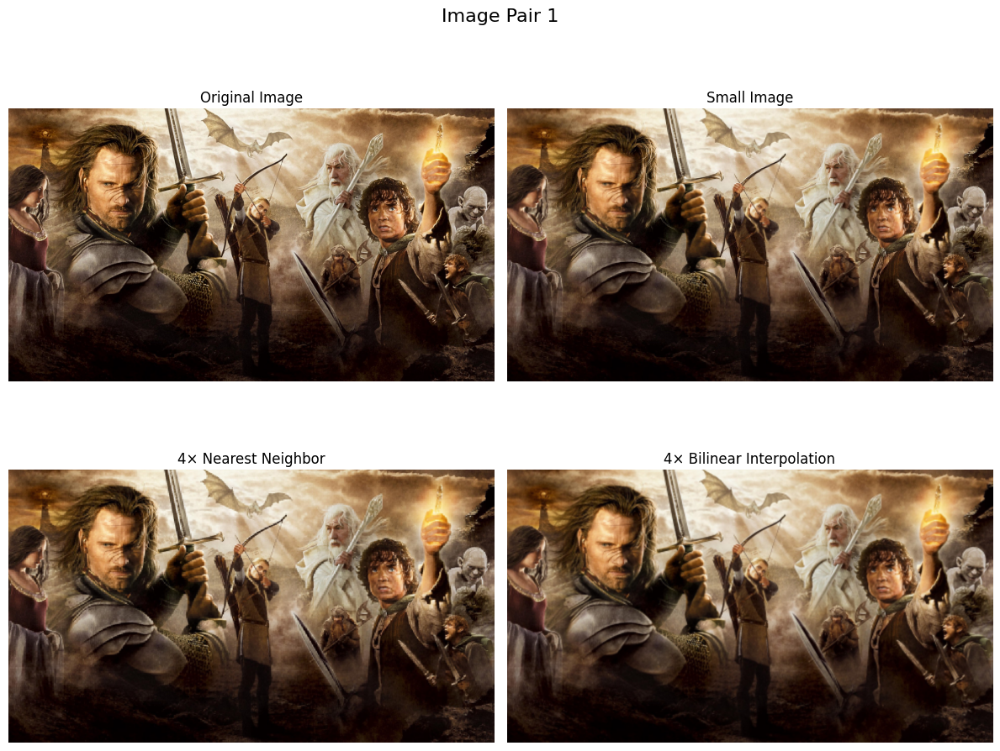

Image Pair 2
Normalized SSD (Nearest Neighbor): 64.6294
Normalized SSD (Bilinear Interpolation): 48.9606


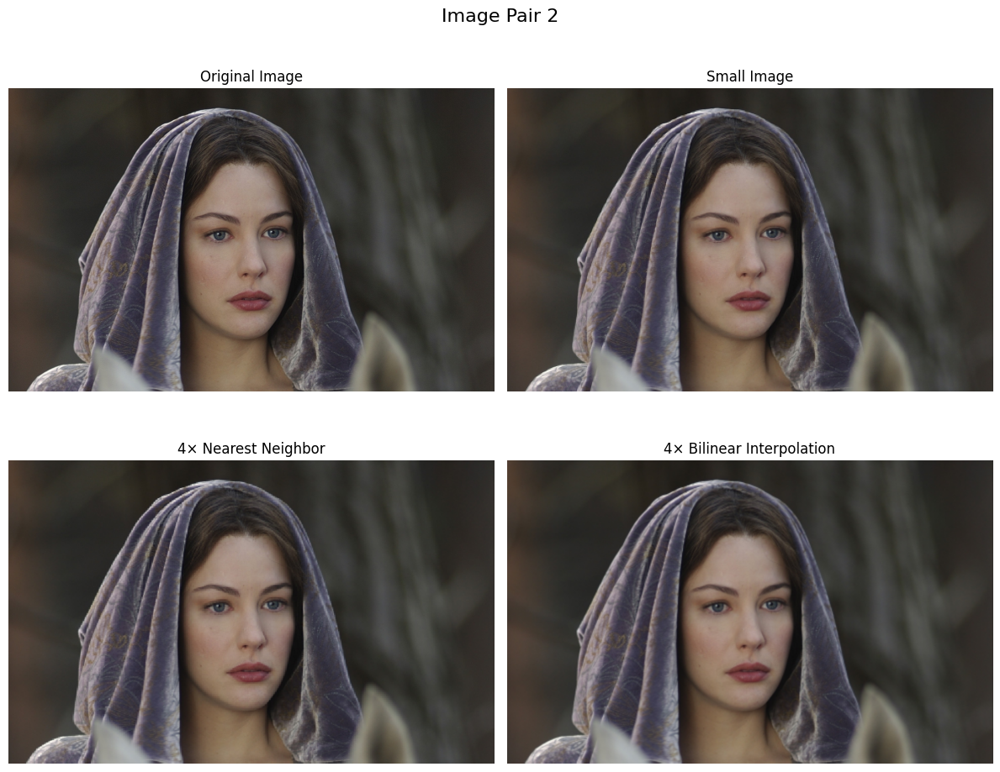


Processing Complete!


In [91]:
def display_results(original, small, nearest, bilinear, title):
    
    original_rgb = cv.cvtColor(original, cv.COLOR_BGR2RGB)
    small_rgb = cv.cvtColor(small, cv.COLOR_BGR2RGB)
    nearest_rgb = cv.cvtColor(nearest, cv.COLOR_BGR2RGB)
    bilinear_rgb = cv.cvtColor(bilinear, cv.COLOR_BGR2RGB)
    plt.figure(figsize=(12, 10))
    plt.suptitle(title, fontsize=16)
    plt.subplot(2,2,1)
    plt.imshow(original_rgb)
    plt.title("Original Image")
    plt.axis("off")
    plt.subplot(2,2,2)
    plt.imshow(small_rgb)
    plt.title("Small Image")
    plt.axis("off")
    plt.subplot(2,2,3)
    plt.imshow(nearest_rgb)
    plt.title("4× Nearest Neighbor")
    plt.axis("off")
    plt.subplot(2,2,4)
    plt.imshow(bilinear_rgb)
    plt.title("4× Bilinear Interpolation")
    plt.axis("off")
    plt.tight_layout()
    plt.show()

image_pairs = [("im01.png", "im01small.png"),("im02.png", "im02small.png")]
scale_factor = 4
for i, (orig_path, small_path) in enumerate(image_pairs, start=1):
    print("=" * 60)
    print(f"Image Pair {i}")
    print("=" * 60)
    original = cv.imread(orig_path)
    small = cv.imread(small_path)
    if original is None or small is None:
        print(f"Cannot read {orig_path} or {small_path}")
        continue
    # Zoom images
    nearest_zoom = zoom_image(small, scale_factor, "nearest")
    bilinear_zoom = zoom_image(small, scale_factor, "bilinear")
    # SSD values
    nearest_ssd = normalized_ssd(original, nearest_zoom)
    bilinear_ssd = normalized_ssd(original, bilinear_zoom)
    print(f"Normalized SSD (Nearest Neighbor): {nearest_ssd:.4f}")
    print(f"Normalized SSD (Bilinear Interpolation): {bilinear_ssd:.4f}")
    # Display images
    display_results(original,small,nearest_zoom,bilinear_zoom,f"Image Pair {i}")
    # Save results
    cv.imwrite(f"image{i}_nearest.png", nearest_zoom)
    cv.imwrite(f"image{i}_bilinear.png", bilinear_zoom)
print("\nProcessing Complete!")

**Question 09**

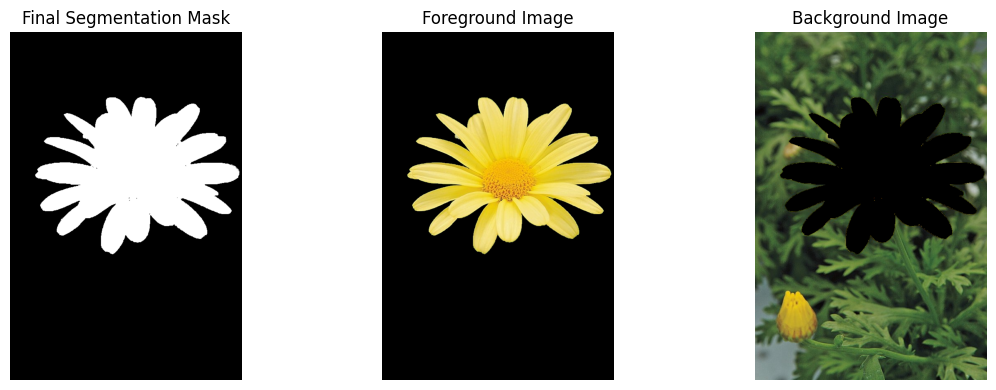

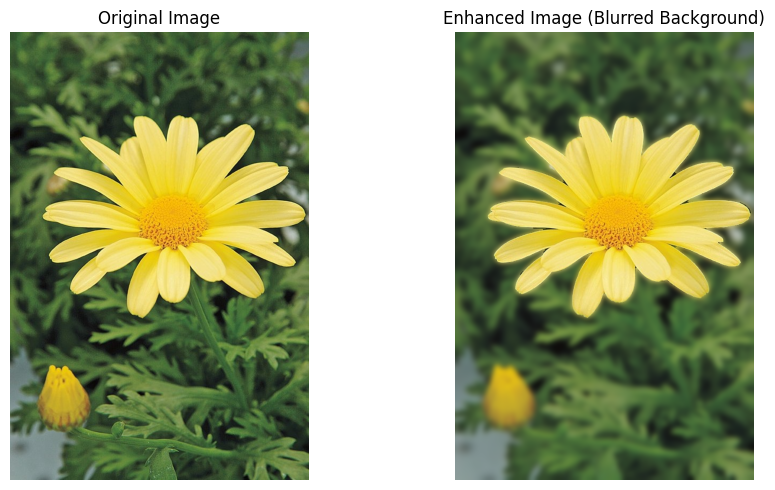

In [92]:
img = cv.imread("flower.jpeg")  
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
mask = np.zeros(img.shape[:2], np.uint8)
bgdModel = np.zeros((1, 65), np.float64)
fgdModel = np.zeros((1, 65), np.float64)

h, w, _ = img.shape
rect = (int(w * 0.1), int(h * 0.1), int(w * 1), int(h * 0.6))
cv.grabCut(img, mask, rect, bgdModel, fgdModel, 5, cv.GC_INIT_WITH_RECT)
binary_mask = np.where((mask == 1) | (mask == 3), 1, 0).astype("uint8")
foreground = img_rgb * binary_mask[:, :, np.newaxis]
background = img_rgb * (1 - binary_mask[:, :, np.newaxis])

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(binary_mask, cmap="gray")
axes[0].set_title("Final Segmentation Mask")
axes[0].axis("off")
axes[1].imshow(foreground)
axes[1].set_title("Foreground Image")
axes[1].axis("off")
axes[2].imshow(background)
axes[2].set_title("Background Image")
axes[2].axis("off")
plt.tight_layout()
plt.show()

blurred_bg = cv.GaussianBlur(img_rgb, (31, 31), 0)
enhanced_img = np.where(binary_mask[:, :, np.newaxis] == 1, img_rgb, blurred_bg)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(img_rgb)
axes[0].set_title("Original Image")
axes[0].axis("off")
axes[1].imshow(enhanced_img)
axes[1].set_title("Enhanced Image (Blurred Background)")
axes[1].axis("off")
plt.tight_layout()
plt.show()

**Gaussian Blur Haloing and Color Contamination**

Applying Gaussian blur to the entire image can create **haloing artifacts** near sharp foreground–background boundaries.

**Gaussian Blur Effect**
- The blur kernel samples pixels from both the **bright flower petals** and **dark background**.
- This causes their colors and intensities to mix near the boundary.
- 
**Color Contamination**
- Dark background pixels become contaminated by bright foreground pixels.
- After overlaying the sharp foreground, this appears as a **dark halo or ring** around the flower.
- 
**Prevention**
The background should be blurred **independently of the foreground**. Mask and fill the foreground region with surrounding background information before applying the blur.

This prevents foreground pixels from affecting the background blur and produces a **cleaner object boundary**.

**Question 10**

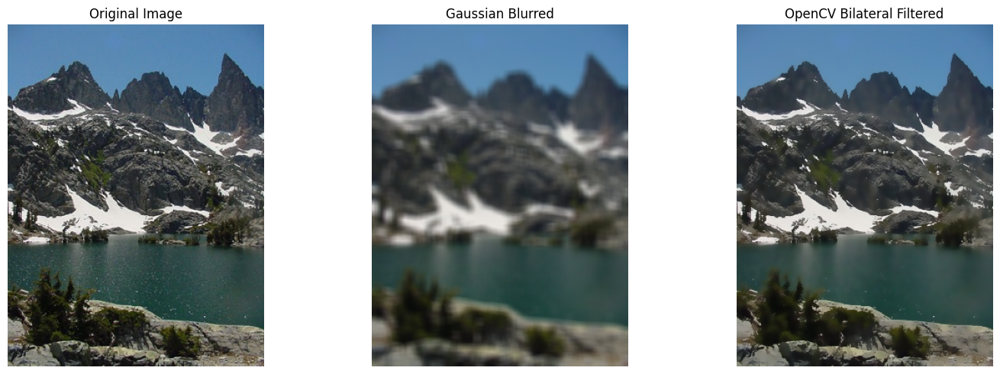

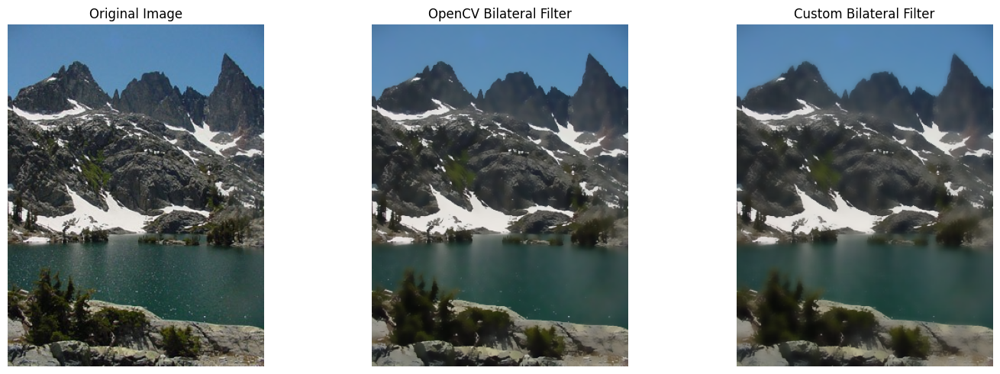

Mean Squared Error (MSE): 29.0938
Peak Signal-to-Noise Ratio (PSNR): 33.49 dB


In [94]:
img = cv.imread('lake.jpeg') 
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
kernel_size = 9
sigma_s = 75.0  # Spatial standard deviation
sigma_r = 75.0  # Range / intensity standard deviation

gaussian_blurred = cv.GaussianBlur(img_rgb, (kernel_size, kernel_size)
                                   , sigmaX=sigma_s)
cv_bilateral = cv.bilateralFilter(img_rgb, d=kernel_size, sigmaColor=sigma_r
                                  , sigmaSpace=sigma_s)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(img_rgb)
axes[0].set_title("Original Image")
axes[0].axis("off")
axes[1].imshow(gaussian_blurred)
axes[1].set_title("Gaussian Blurred")
axes[1].axis("off")
axes[2].imshow(cv_bilateral)
axes[2].set_title("OpenCV Bilateral Filtered")
axes[2].axis("off")
plt.tight_layout()
plt.show()

def custom_bilateral_filter(img, d, sigma_s, sigma_r):
    """
    Applies bilateral filtering to a color image (H, W, 3).
    """
    radius = d // 2
    pad_img = np.pad(img, ((radius, radius), (radius, radius), (0, 0))
                     , mode='reflect').astype(np.float32)
    height, width, channels = img.shape
    filtered_img = np.zeros_like(img, dtype=np.float32)

    # Pre-compute spatial Gaussian domain component
    y, x = np.mgrid[-radius:radius+1, -radius:radius+1]
    spatial_weights = np.exp(-(x**2 + y**2) / (2 * (sigma_s ** 2))) # (d, d)

    for i in range(height):
        for j in range(width):
            # Extract neighborhood window
            region = pad_img[i:i + d, j:j + d] # (d, d, 3)
            center_pixel = pad_img[i + radius, j + radius] # (3,)

            # Calculate range weights based on intensity distance across channels
            color_diff = region - center_pixel
            range_weights = np.exp(-np.sum(color_diff**2, axis=-1) / 
                                   (2 * (sigma_r ** 2))) # (d, d)

            # Combined bilateral weight
            combined_weights = spatial_weights * range_weights # (d, d)
            normalization_factor = np.sum(combined_weights)

            # Compute filtered pixel value for each channel
            for c in range(channels):
                filtered_img[i, j, c] = np.sum(region[:, :, c] * 
                        combined_weights) /normalization_factor

    return np.clip(filtered_img, 0, 255).astype(np.uint8)

custom_bilateral = custom_bilateral_filter(img_rgb, d=kernel_size,
                                           sigma_s=sigma_s, 
                                           sigma_r=sigma_r)

# Display Comparison
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(img_rgb)
axes[0].set_title("Original Image")
axes[0].axis("off")
axes[1].imshow(cv_bilateral)
axes[1].set_title("OpenCV Bilateral Filter")
axes[1].axis("off")
axes[2].imshow(custom_bilateral)
axes[2].set_title("Custom Bilateral Filter")
axes[2].axis("off")
plt.tight_layout()
plt.show()
# Quantitative Evaluation (Mean Squared Error & PSNR)
mse = np.mean((cv_bilateral.astype(np.float64) - custom_bilateral
    .astype(np.float64)) ** 2)
psnr = cv.PSNR(cv_bilateral, custom_bilateral)
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Peak Signal-to-Noise Ratio (PSNR): {psnr:.2f} dB")

**1. Edge Preservation vs. Noise Reduction**
The **bilateral filter** smooths homogeneous regions while preserving sharp edges, unlike Gaussian filtering, which can blur across boundaries.
Its weight function combines **spatial** and **intensity** differences:
$$
W(i,j,k,l)=
\exp\left(-\frac{(i-k)^2+(j-l)^2}{2\sigma_s^2}\right)
\exp\left(-\frac{\|I(i,j)-I(k,l)\|^2}{2\sigma_r^2}\right)
$$
The range term reduces the influence of pixels with significantly different intensities, preventing **cross-edge averaging**.

**2. Parameter Sensitivity**
- **\(\sigma_s\):** Controls the spatial neighborhood. Larger values produce stronger smoothing.
- **\(\sigma_r\):** Controls sensitivity to intensity differences. Large values cause more smoothing across edges, while very small values may leave noise.
- 
**3. Performance and Evaluation**
- **OpenCV:** `cv.bilateralFilter` is significantly faster due to optimized C++ implementation and parallel processing.
- **Accuracy:** A **high PSNR (>40 dB)** and **low MSE** between the custom and OpenCV implementations indicate very similar results, with only minor floating-point differences.